In [56]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# Full Batch

In [57]:
import numpy as np

def gradient_full_batch(X, y, epochs, iterations=10000, alpha=0.001, thresh=0.001):
    # N is number of features in X and d is the number of samples 

    N = X.shape[1]
    d = X.shape[0]

    params = []

    theta = np.random.rand(N) * np.random.randint(-30, 30)
    
    y_pred = X @ theta

    J_theta = float('inf')

    losses = []
    iters = 0
    for epoch in range(1, epochs+1):
        if J_theta > thresh:
            iters += 1

        if epoch % 1000 == 0:
            print(theta)
            params.append(theta.copy())  # Append a copy of theta
            losses.append(J_theta)

        if J_theta < thresh:
            params.append(theta.copy())  # Append a copy of theta
            losses.append(J_theta)
            return params, losses, iters

        y_pred = X @ theta

        gradient = (1 / d) * (X.T @ (y_pred - y))
        
        theta -= alpha * gradient
    
        J_theta = (1 / (2 * d)) * np.sum((X @ theta - y) ** 2)

        print("Full batch Loss: ",J_theta)
    
    return params, losses, iters


# Mini Batch

In [58]:
# def create_batches(X,y,num_batches):
#     batch_size = X.shape[0] // num_batches
#     indices = np.random.permutation(X.shape[0])
#     X_shuffled = X[indices]
#     y_shuffled = y[indices]

#     mini_batches = []
#     for i in range(0,X.shape[0],batch_size):
#         mini_batches.append((X_shuffled[i:i+batch_size],y_shuffled[i:i+batch_size]))

#     return mini_batches


def create_batches(X, y, num_batches):
    indices = np.random.permutation(X.shape[0])
    X_shuffled = X[indices]
    y_shuffled = y[indices]

    batch_size = X.shape[0]//num_batches
    
    X_batches = np.array_split(X_shuffled[:num_batches * batch_size], num_batches)
    y_batches = np.array_split(y_shuffled[:num_batches * batch_size], num_batches)
    
    if X.shape[0] % batch_size != 0:
        X_batches.append(X_shuffled[num_batches * batch_size:])
        y_batches.append(y_shuffled[num_batches * batch_size:])
    
    mini_batches = list(zip(X_batches, y_batches))
    
    return mini_batches

In [59]:
def gradient_mini_batch(X,y,num_batch,epochs,iterations = 10000,alpha = 0.001,thresh = 0.001):
    # N is number of features in X and d is the number of samples 

    N = X.shape[1]
    d = X.shape[0]

    params = []
    theta = np.random.rand(N)*np.random.randint(-30,30)

    losses = []
    iters = 0
    J_theta = float('inf')

    for epoch in range(1,epochs):

        if J_theta > thresh:
            iters += 1

        if epoch % 1000 == 0:
            print(theta)
            params.append(theta.copy())  # Append a copy of theta
            losses.append(J_theta)

        if J_theta < thresh:
            params.append(theta.copy())  # Append a copy of theta
            losses.append(J_theta)
            return params, losses, iters

        batches = create_batches(X,y,num_batch)
        for batch in batches:               
            x_b = batch[0]
            y_b = batch[1]

            y_hat_b = x_b @ theta
            gradient = (1 / d) * (x_b.T @ (y_hat_b - y_b))
            theta -= alpha * gradient


        J_theta = (1 / (2 * d)) * np.sum((X @ theta - y) ** 2)

        print("Mini batch Loss: ",J_theta)
        
    
    return params, losses , iters

        

# Stochastic 

In [60]:
def gradient_SGD(X, y, epochs,iterations=10000, alpha=0.001,thresh = 0.001):
    N = X.shape[1]  # Number of features
    d = X.shape[0]  # Number of samples

    params = []
    theta = np.random.rand(N) * np.random.randint(-30, 30)

    losses = []
    iters = 0

    J_theta = float('inf')

    for epoch in range(1,epochs):
        for i in range(d):

            if J_theta > thresh:
                iters += 1

            if epoch % 1000 == 0:
                print(theta)
                params.append(theta.copy())  # Append a copy of theta
                losses.append(J_theta)

            if J_theta < thresh:
                for i in range(epoch,epochs,1000):
                    params.append(theta.copy())  # Append a copy of theta
                    losses.append(J_theta)
                return params, losses, iters

            x_i = X[i:i+1]
            y_i = y[i:i+1]
            
            y_hat_i = x_i @ theta
            
            gradient = (x_i.T @ (y_hat_i - y_i))
            
            theta -= alpha * gradient

            J_theta = (1 / (2 * d)) * np.sum((X @ theta - y) ** 2)

        print("SGD Loss ",J_theta)
    
    return params, losses,iters

# Comparison

In [61]:
def make_data(noise=0.3, degree=1, num_samples=100, random_state=None):
    if random_state:
        np.random.seed(random_state)
    
    X = np.linspace(-1, 1, num_samples)
    
    coeffs = np.random.randn(degree + 1)
    
    y = np.polyval(coeffs, X)
    
    y += np.random.normal(scale=noise, size=y.shape)
    
    X = X.reshape(-1, 1)
    
    return X, y


In [62]:
X, y = make_data(noise=0.02  , degree=1, num_samples=200, random_state=42)

X = np.concatenate([np.ones((X.shape[0],1)),X],axis = 1)

# X = np.concatenate([np.ones((X.shape[0],1)),X, X**2, X**3, X**4], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

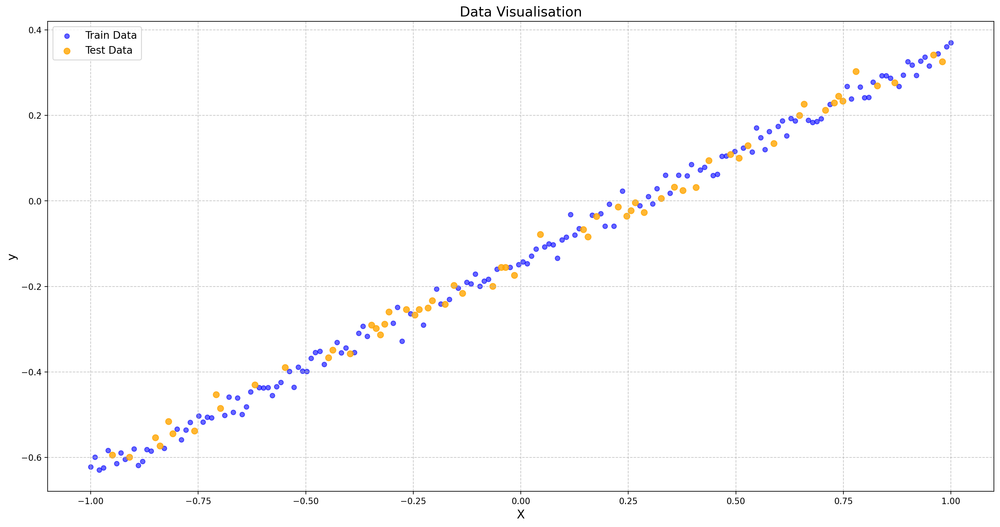

In [63]:
plt.figure(figsize=(20, 10))
plt.scatter(X_train[:, 1], y_train, s=30, label="Train Data", color='blue', alpha=0.6)
plt.scatter(X_test[:, 1], y_test, s=50, label="Test Data", color='orange', alpha=0.8)
plt.title("Data Visualisation", fontsize=16)
plt.xlabel("X", fontsize=14)
plt.ylabel("y", fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(fontsize=12)
plt.show()

In [64]:
epochs = 50000
epsilon = 0.001

num_batch = 10

full_grad_thetas,full_grad_losses,full_grad_iters = gradient_full_batch(X_train,y_train,epochs,iterations=10000,alpha=0.001,thresh=epsilon)

mini_grad_thetas,mini_grad_losses,mini_grad_iters = gradient_mini_batch(X_train,y_train,num_batch,epochs,iterations=10000,alpha=0.001,thresh=epsilon)

sgd_grad_thetas,sgd_grad_losses,sgd_grad_iters = gradient_SGD(X_train,y_train,epochs,iterations=10000,alpha=0.001,thresh=epsilon)

        

Full batch Loss:  93.85391570273504
Full batch Loss:  93.69715684267983
Full batch Loss:  93.54068934581234
Full batch Loss:  93.38451264535226
Full batch Loss:  93.22862617564134
Full batch Loss:  93.07302937214088
Full batch Loss:  92.91772167142972
Full batch Loss:  92.76270251120178
Full batch Loss:  92.60797133026418
Full batch Loss:  92.45352756853465
Full batch Loss:  92.29937066703955
Full batch Loss:  92.14550006791166
Full batch Loss:  91.99191521438775
Full batch Loss:  91.8386155508067
Full batch Loss:  91.68560052260712
Full batch Loss:  91.53286957632508
Full batch Loss:  91.38042215959219
Full batch Loss:  91.22825772113316
Full batch Loss:  91.07637571076373
Full batch Loss:  90.92477557938855
Full batch Loss:  90.77345677899888
Full batch Loss:  90.62241876267055
Full batch Loss:  90.47166098456172
Full batch Loss:  90.32118289991077
Full batch Loss:  90.17098396503404
Full batch Loss:  90.02106363732395
Full batch Loss:  89.87142137524648
Full batch Loss:  89.72205663

In [65]:
def compute_cost(X, y, theta):
    m = len(y)
    predictions = X @ theta
    cost = (1 / (2 * m)) * np.sum((predictions - y) ** 2)
    return cost


def plot_contours(thetas_arr, X, y,limit = None):
    theta0_vals = np.linspace(-2, 2, 100)
    theta1_vals = np.linspace(-2, 2, 100)

    for j, theta in enumerate(thetas_arr, 1):
        J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

        for i, theta0 in enumerate(theta0_vals):
            for k, theta1 in enumerate(theta1_vals):
                t = np.array([theta0, theta1])
                J_vals[i, k] = compute_cost(X, y, t)

        J_vals = J_vals.T
        
        plt.figure(figsize=(8, 6))
        plt.contourf(theta0_vals, theta1_vals, J_vals, levels=50, cmap='plasma')
        plt.colorbar(label='Cost')

        # Plot the theta point with a red cross
        plt.scatter(theta[0], theta[1], color='red', marker='x', s=100, linewidth=2)

        # Add vertical and horizontal dotted lines
        plt.axvline(x=theta[0], color='white', linestyle='--', linewidth=1)
        plt.axhline(y=theta[1], color='white', linestyle='--', linewidth=1)

        # Beautify the plot
        plt.title(f'Contour Plot at Epoch {j}', fontsize=14, fontweight='bold')
        plt.xlabel('Theta 0', fontsize=12)
        plt.ylabel('Theta 1', fontsize=12)
        plt.grid(True, which='both', linestyle='--', linewidth=0.5)
        plt.show()


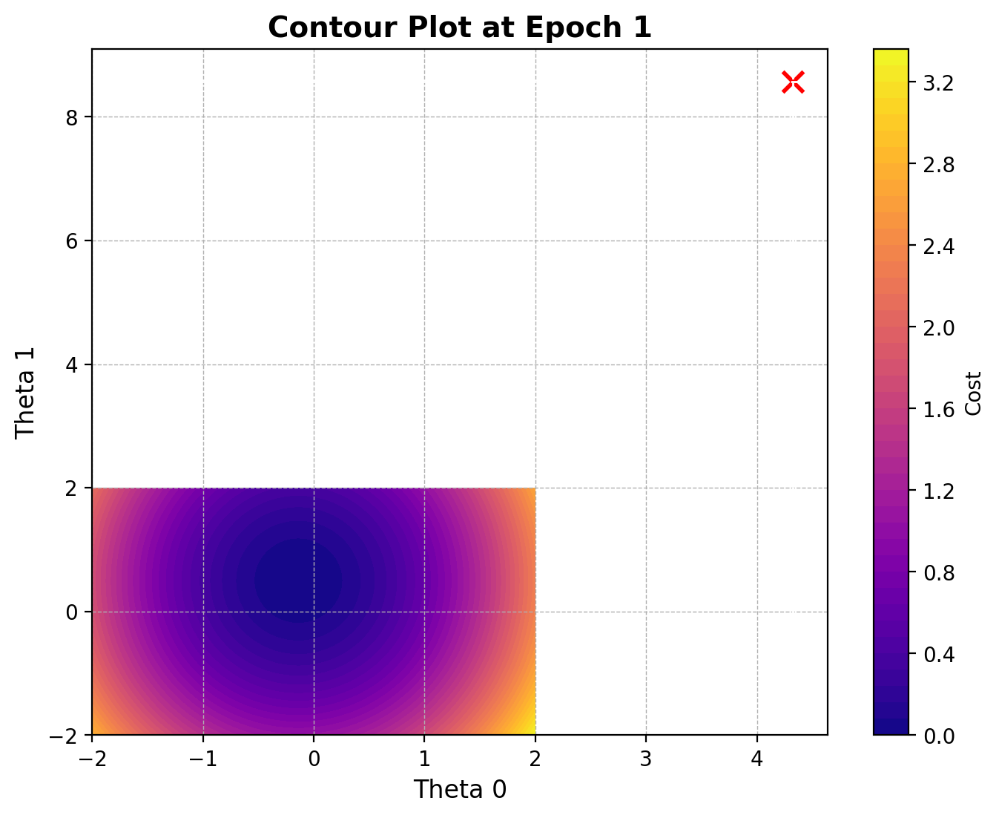

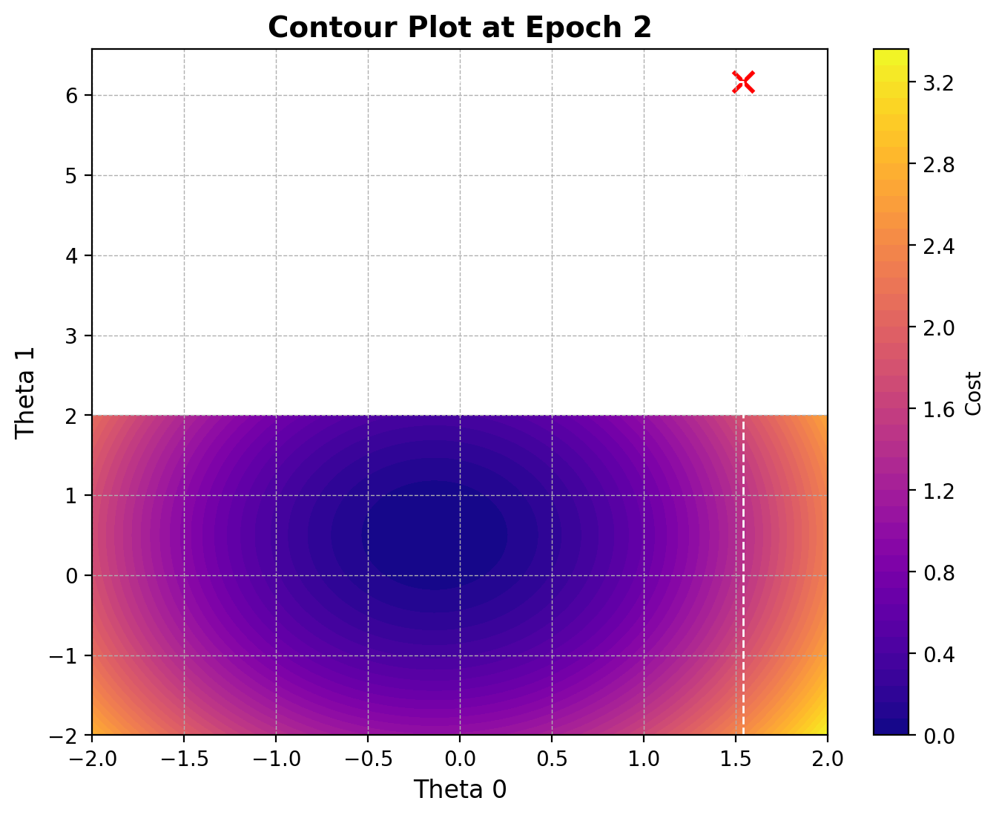

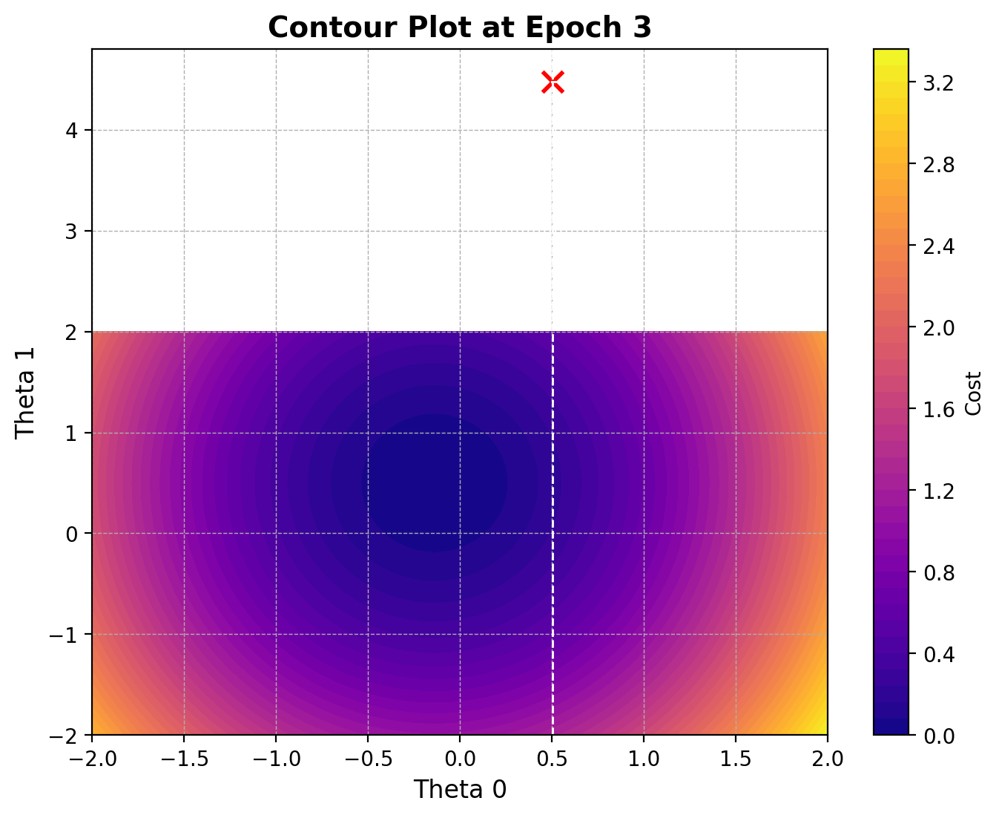

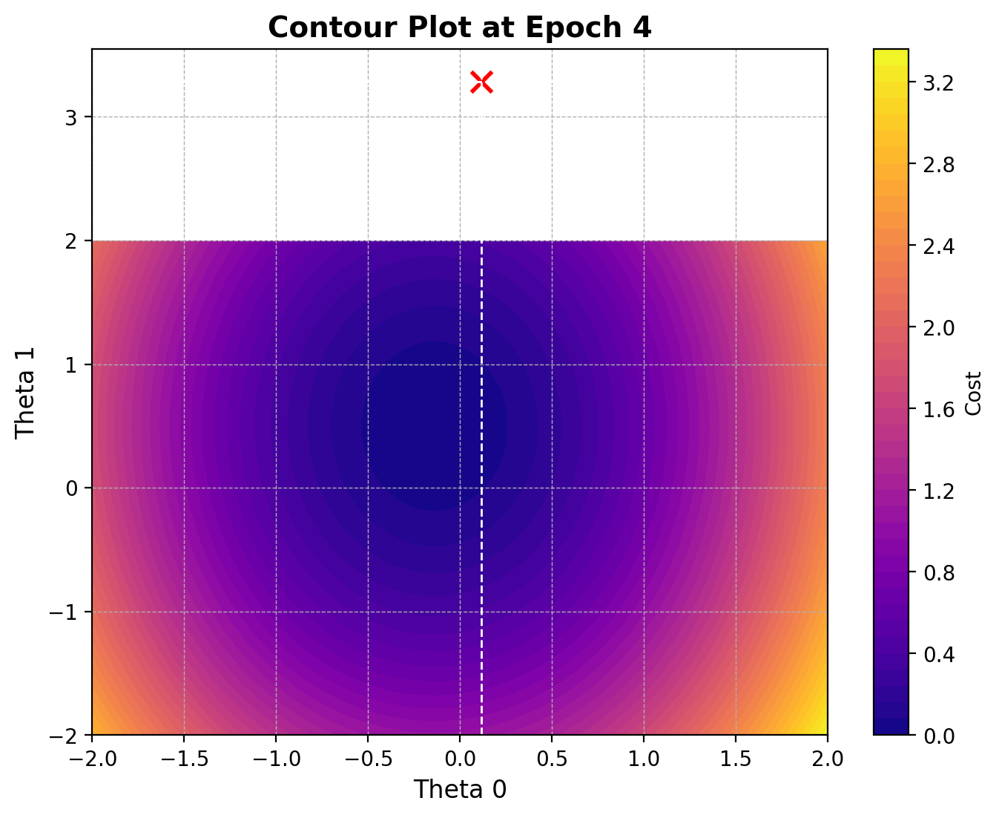

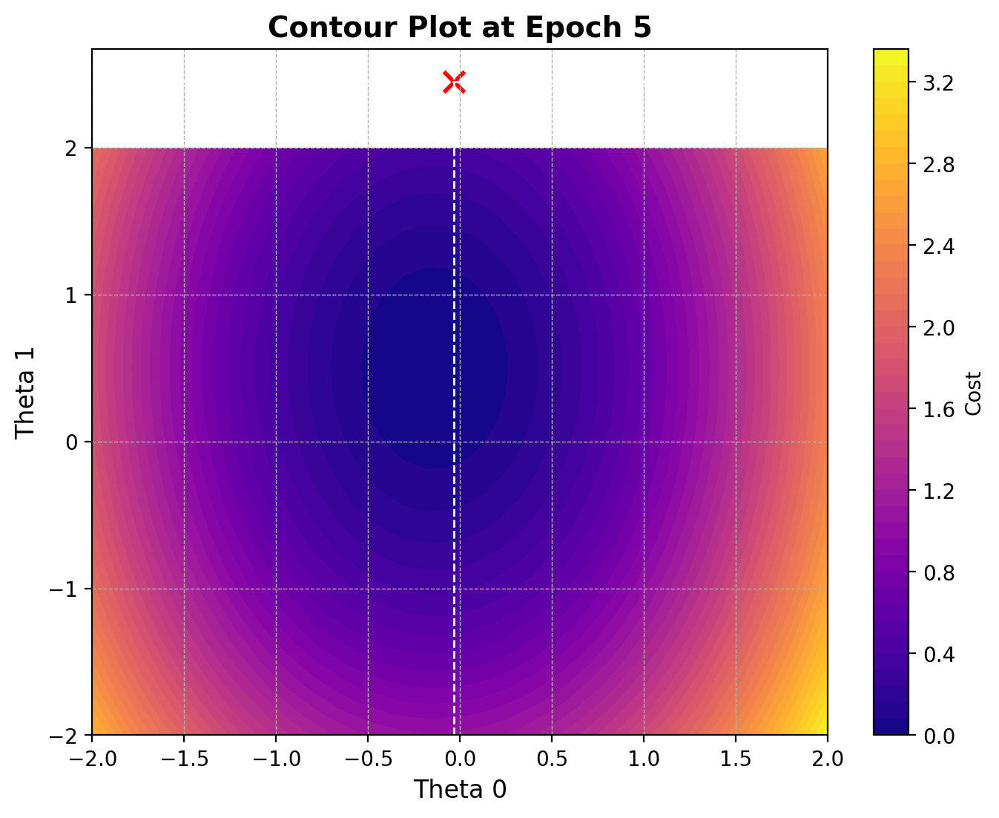

...

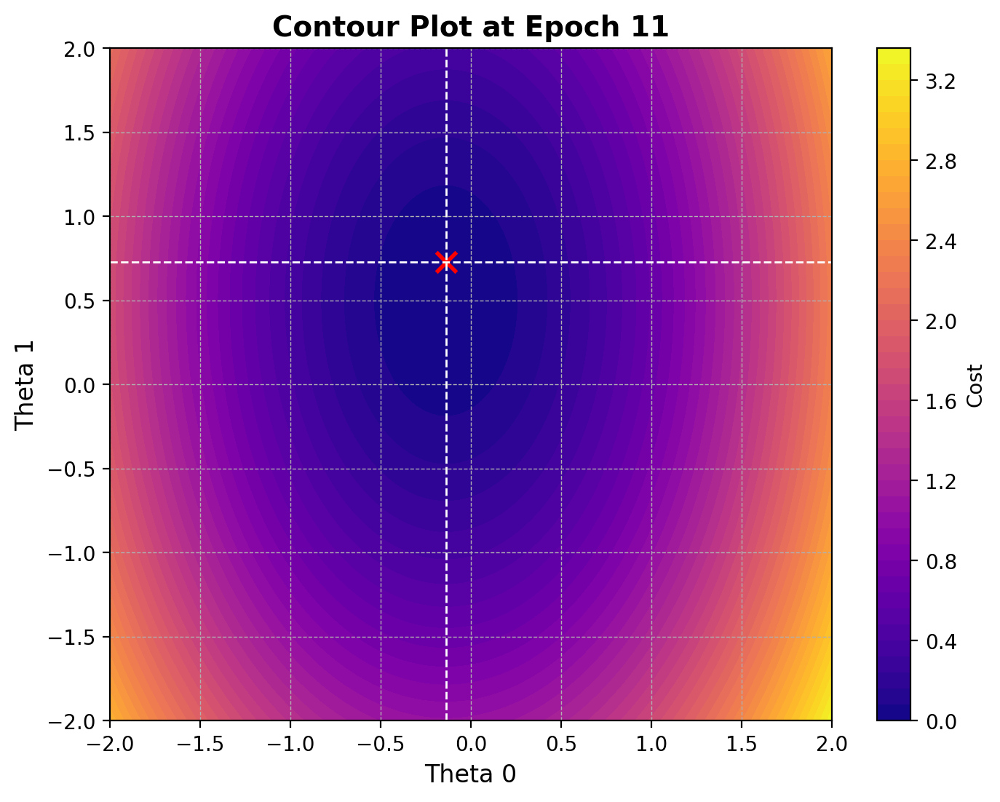

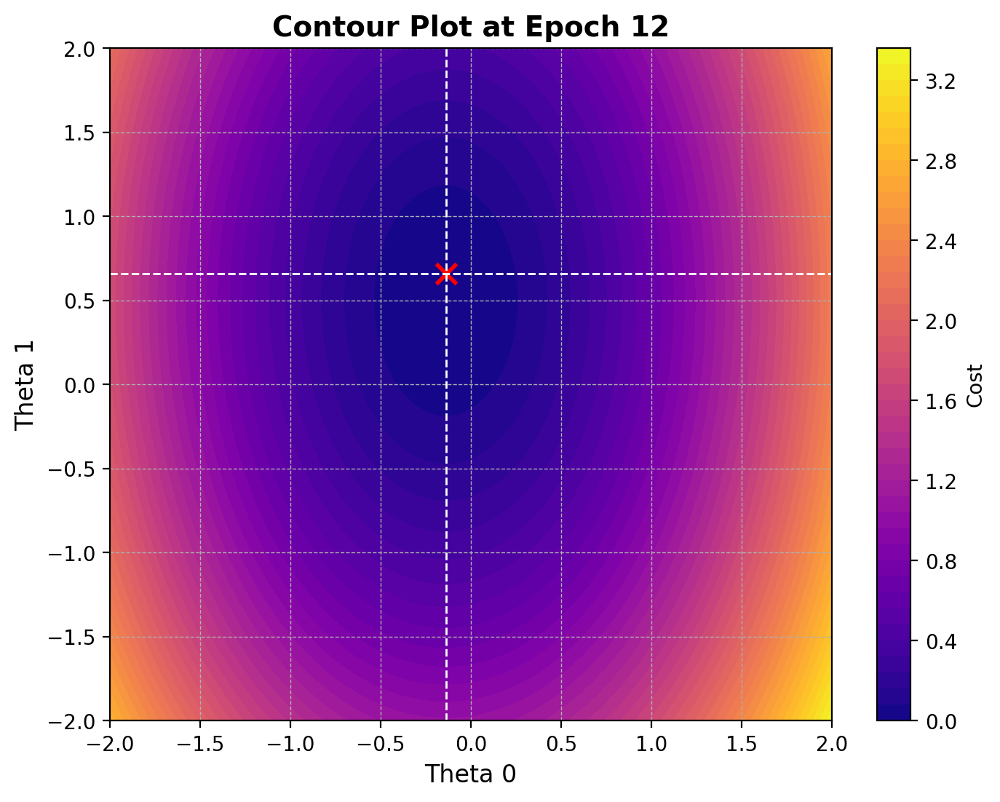

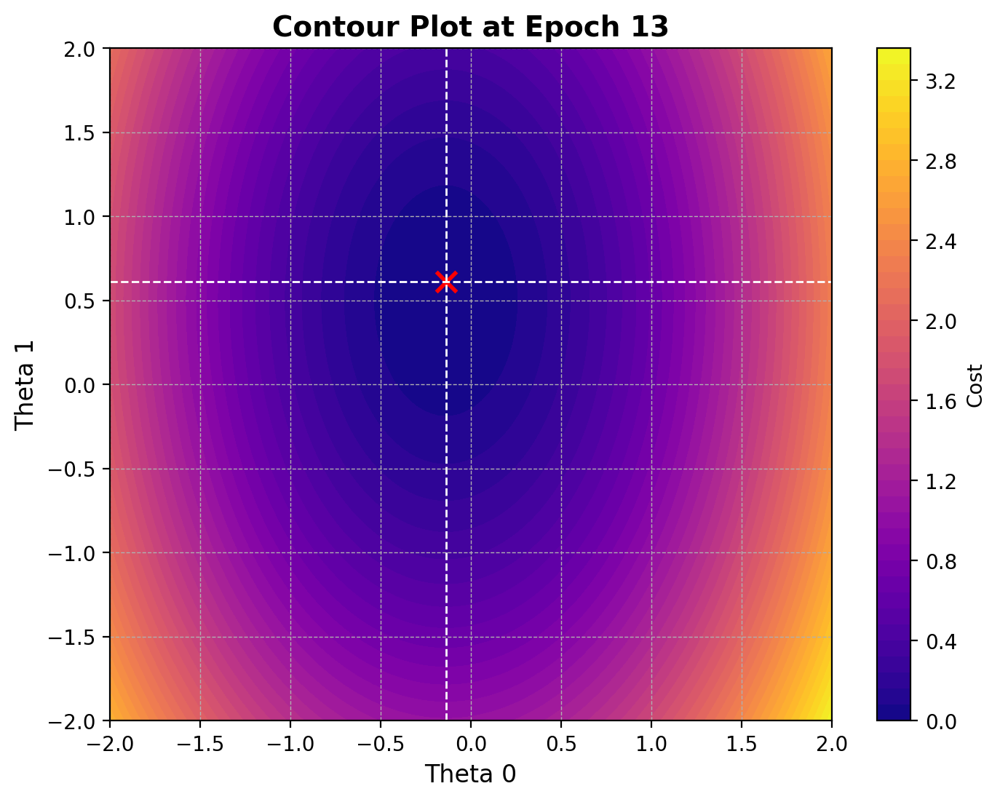

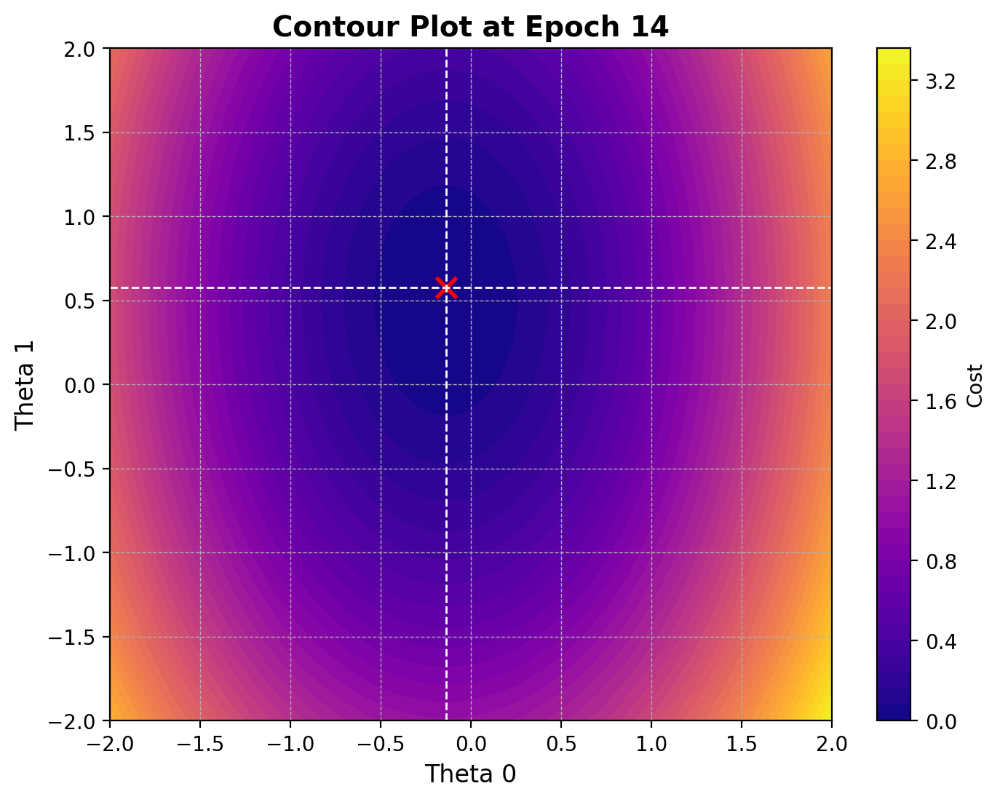

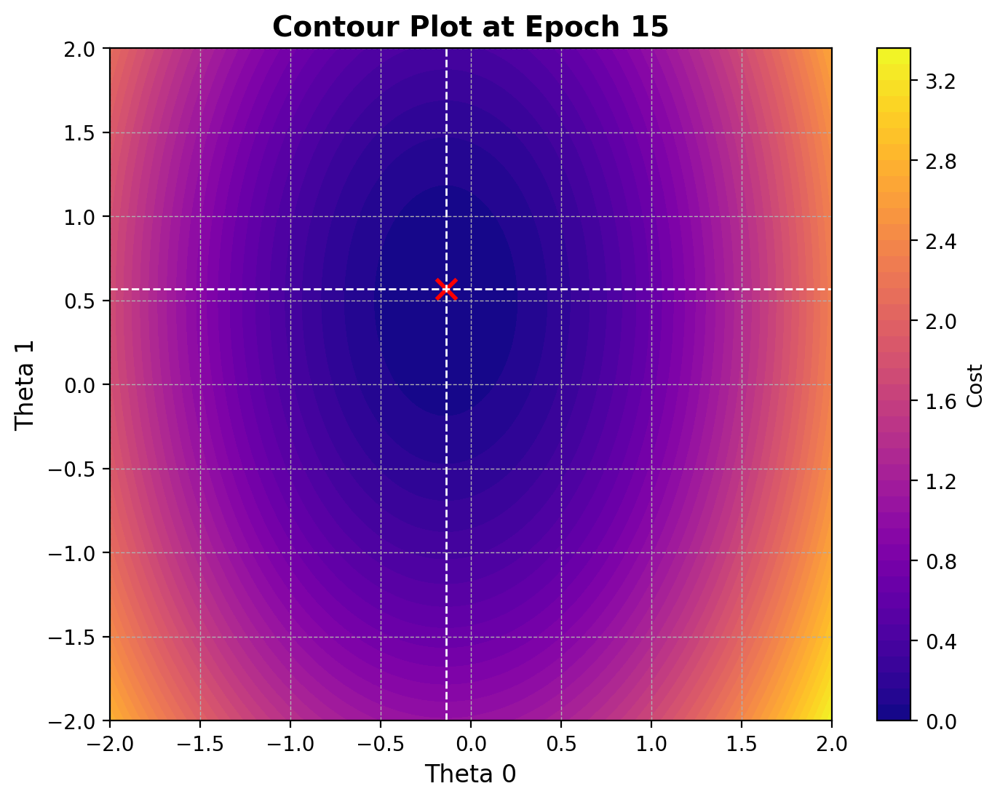

In [66]:
plot_contours(full_grad_thetas,X,y)

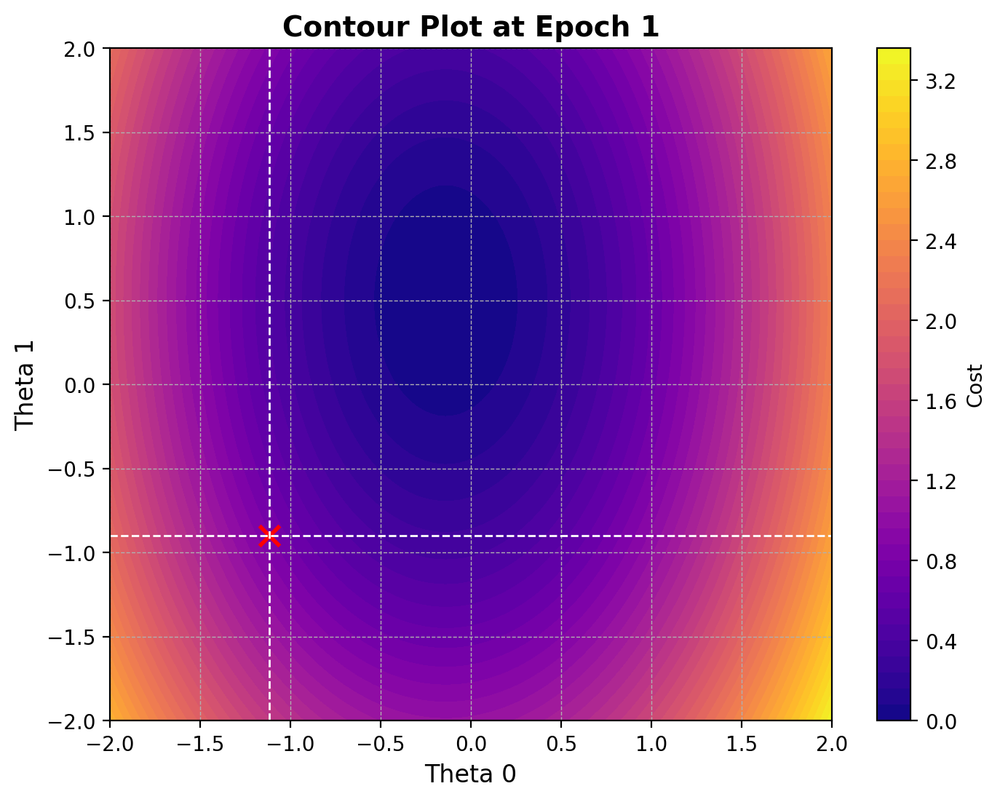

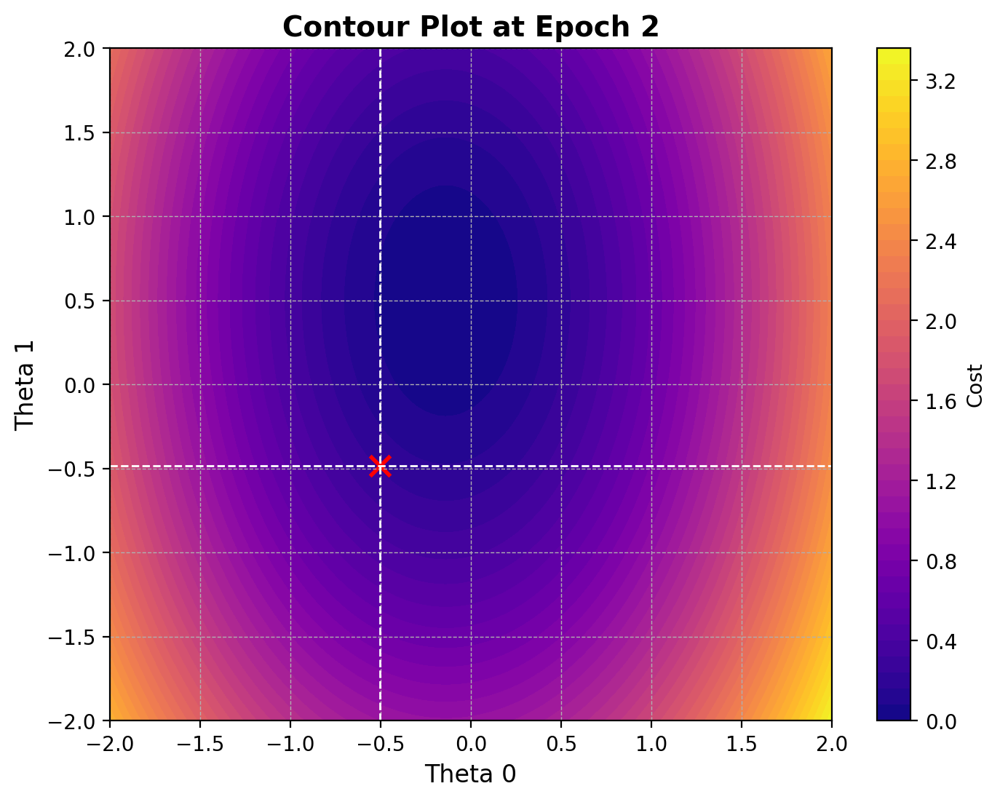

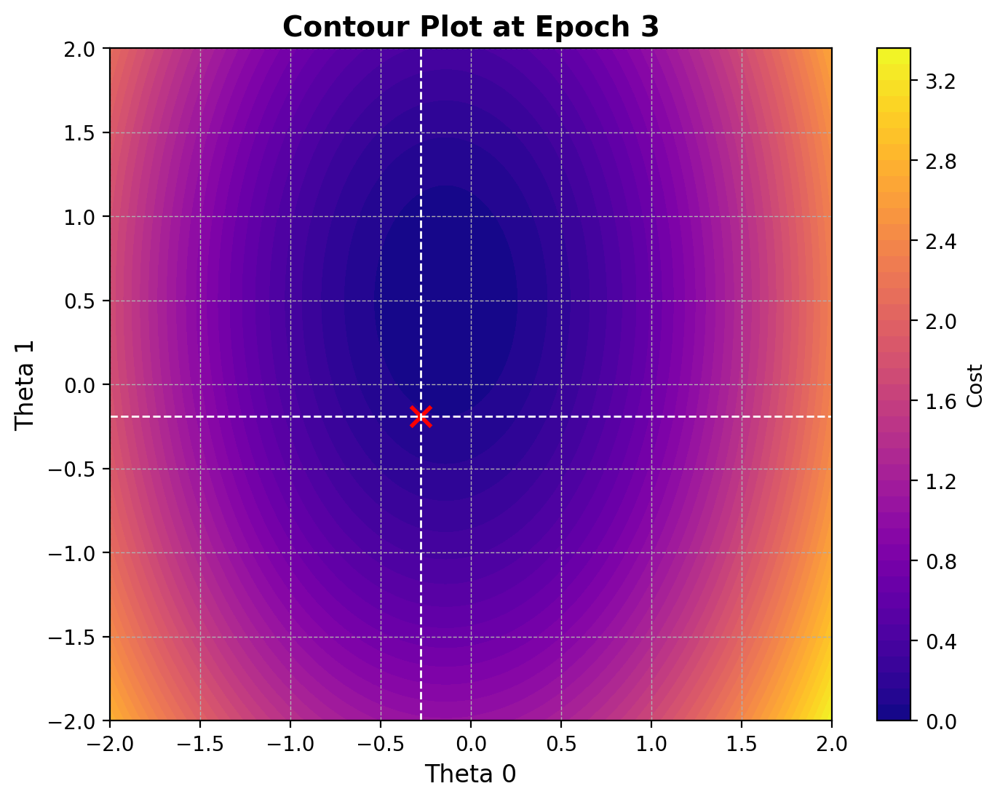

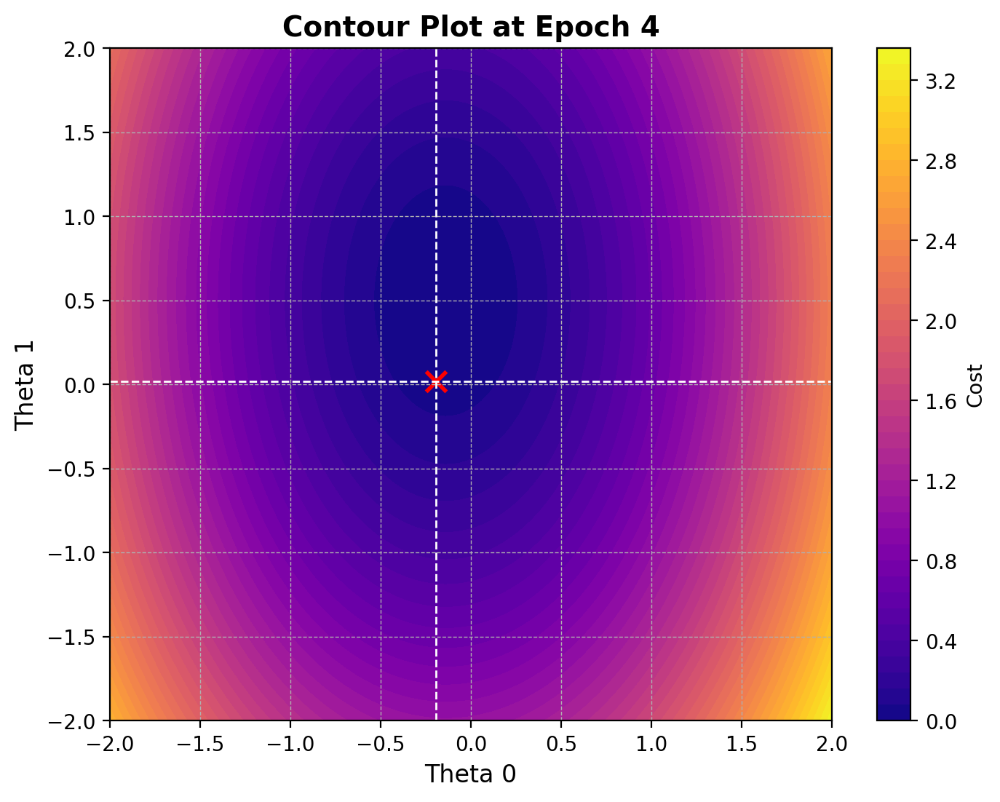

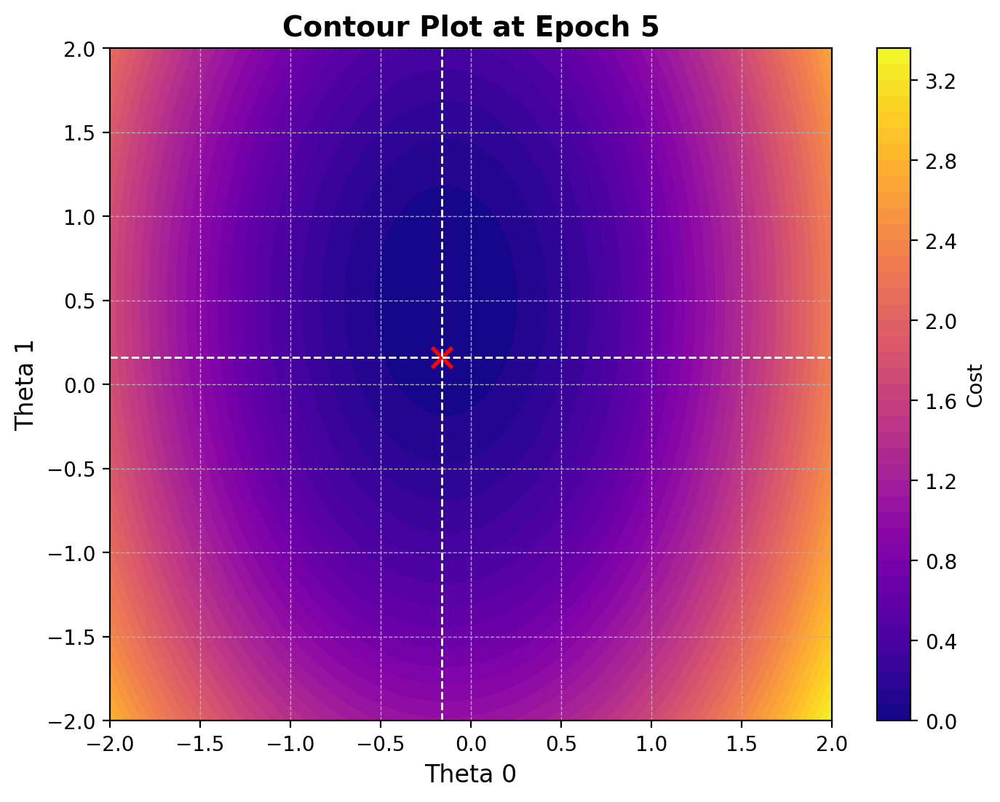

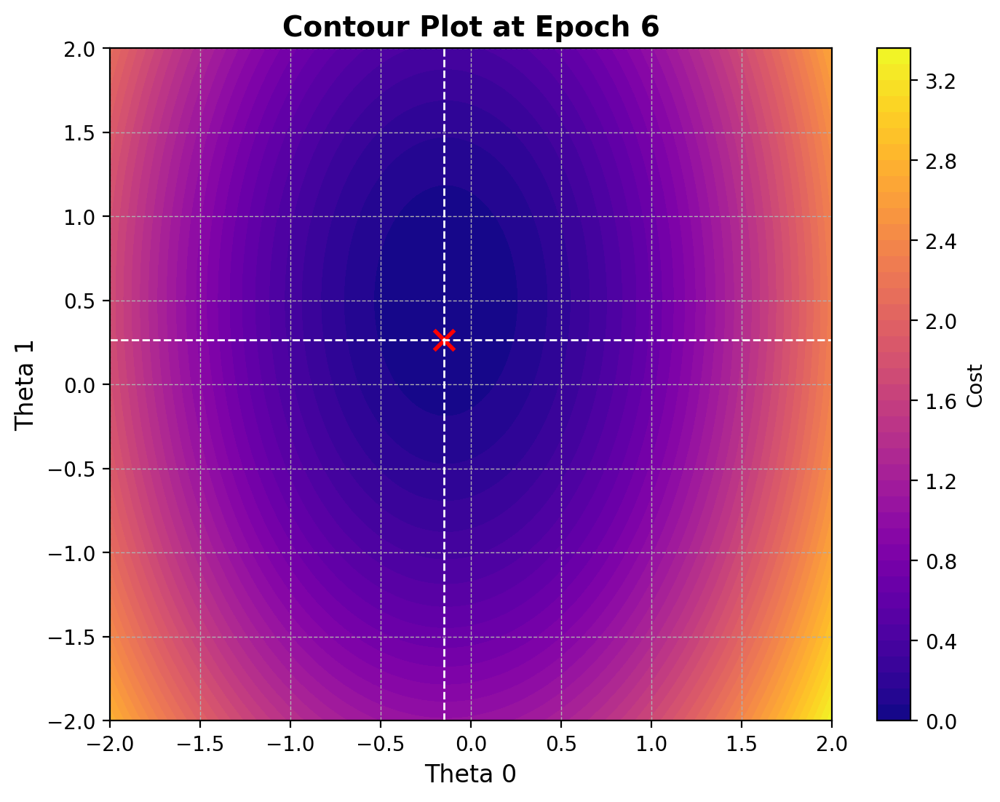

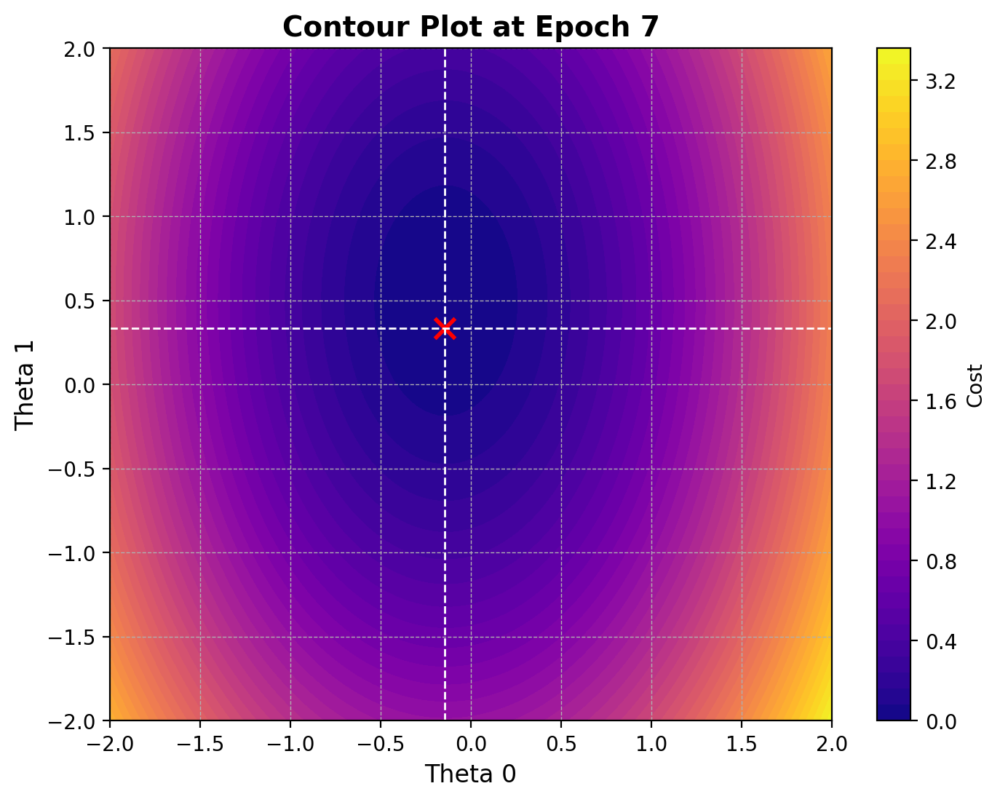

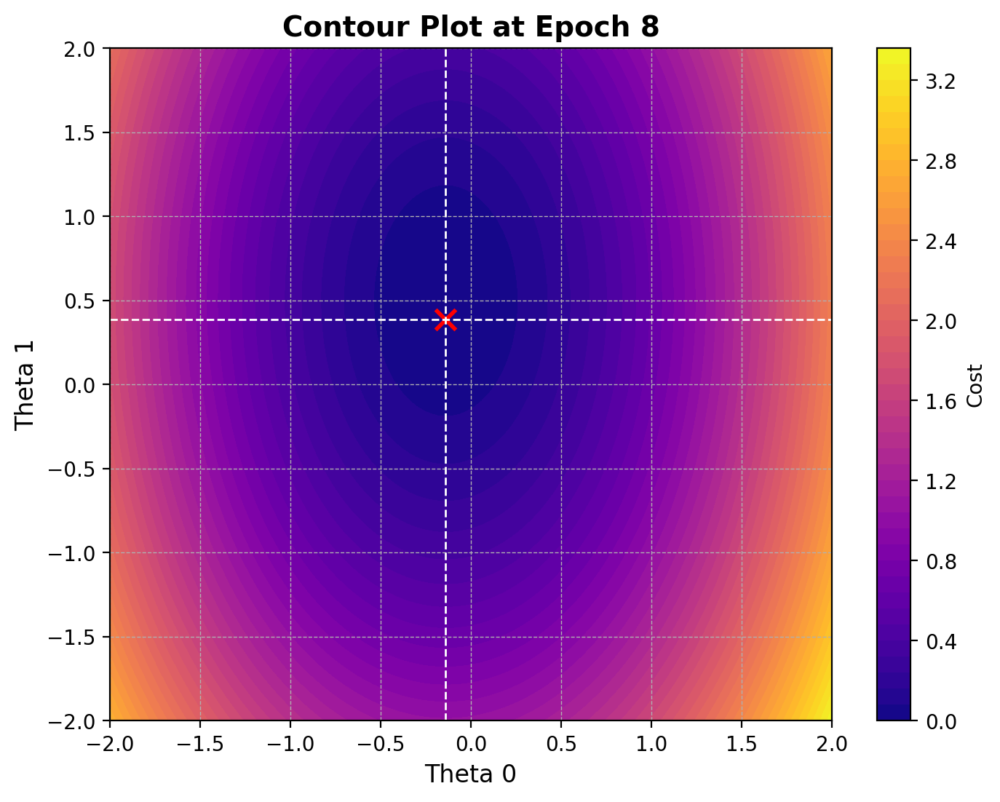

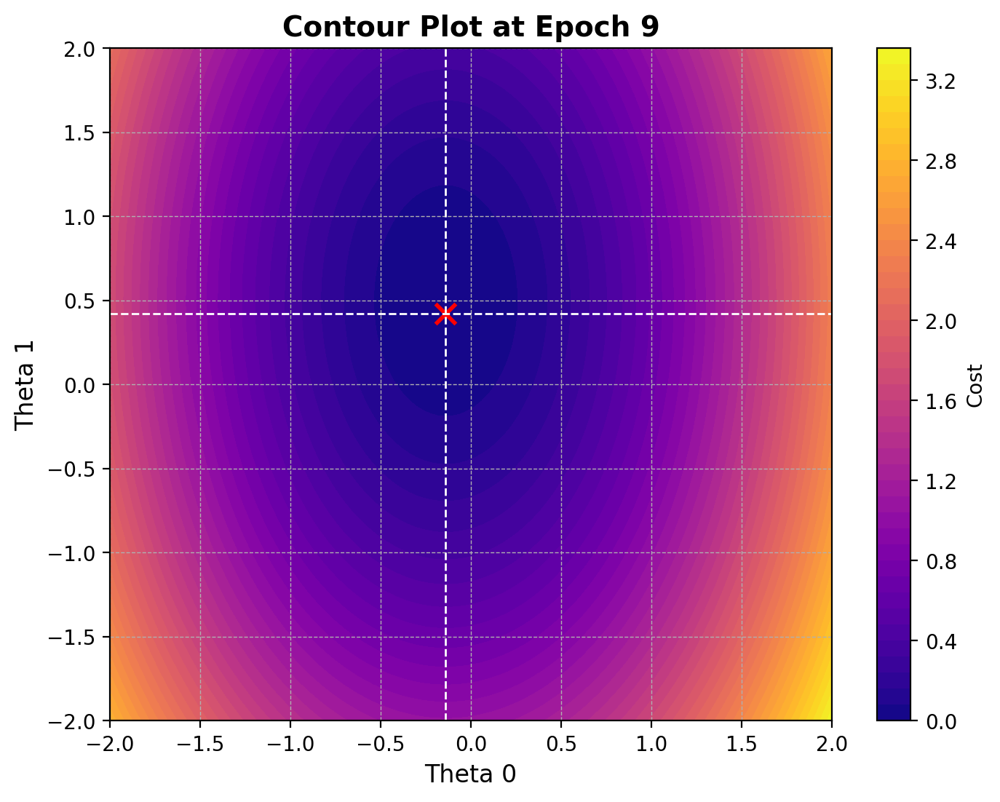

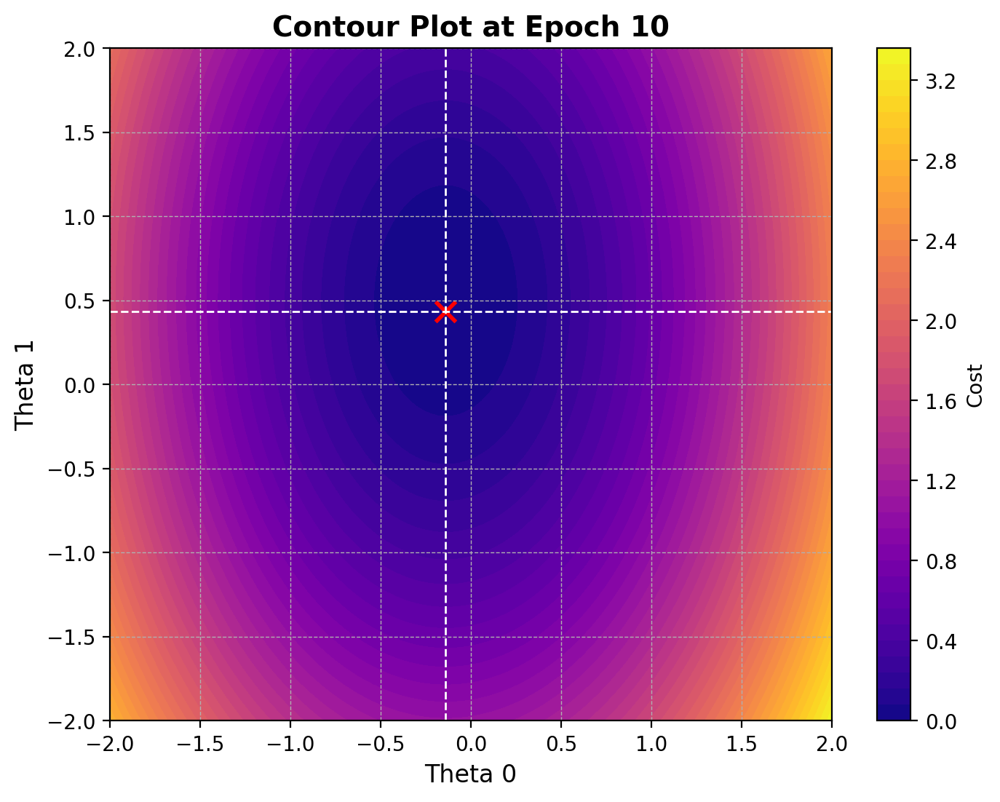

In [67]:
plot_contours(mini_grad_thetas,X,y)

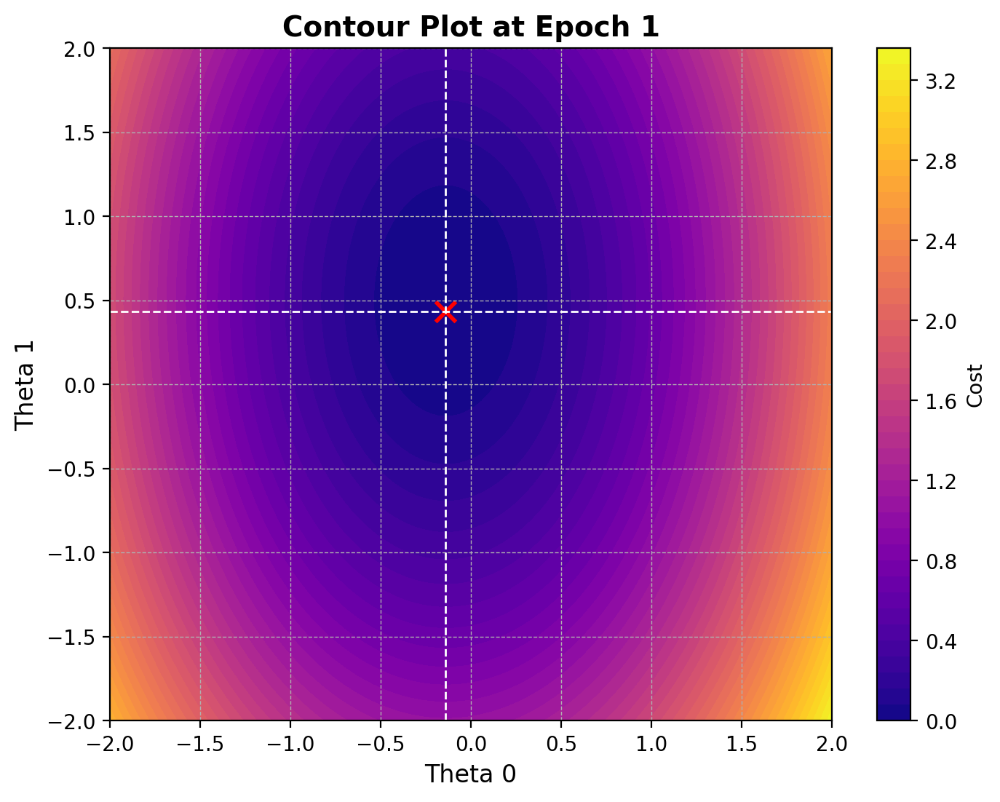

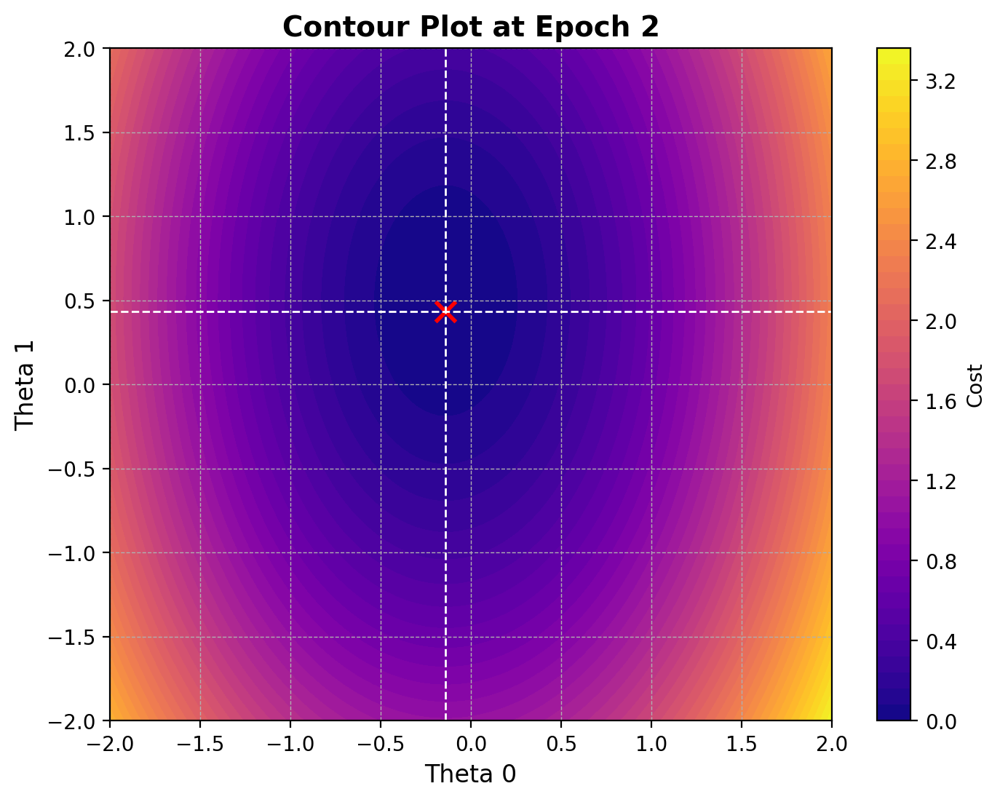

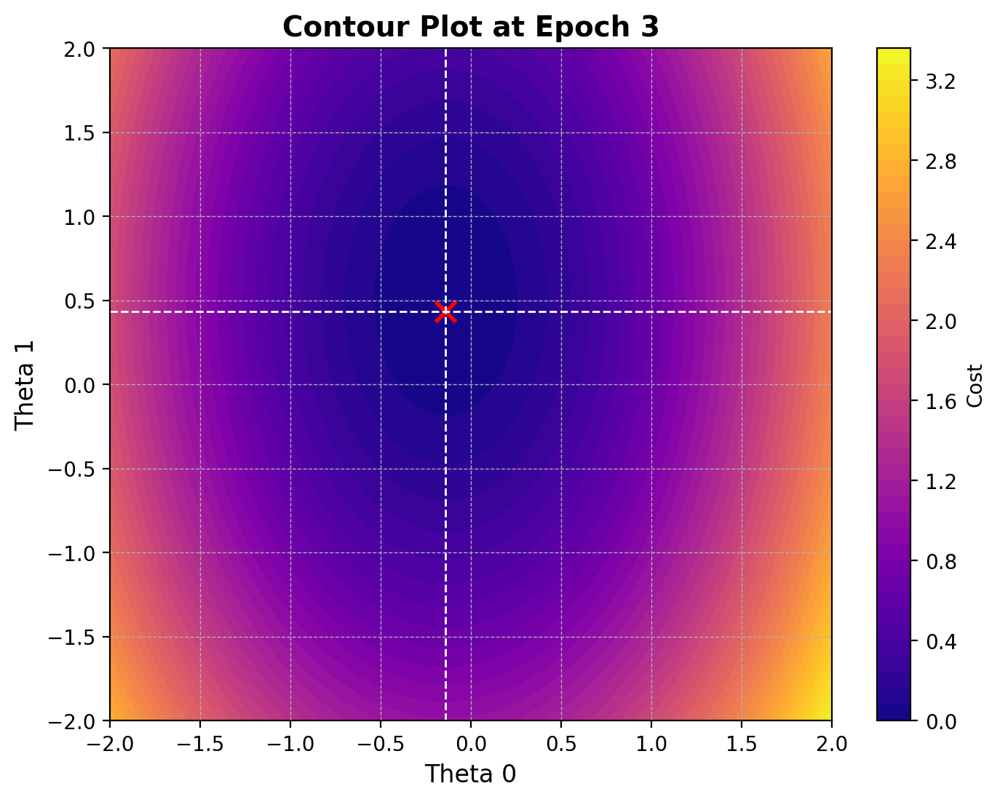

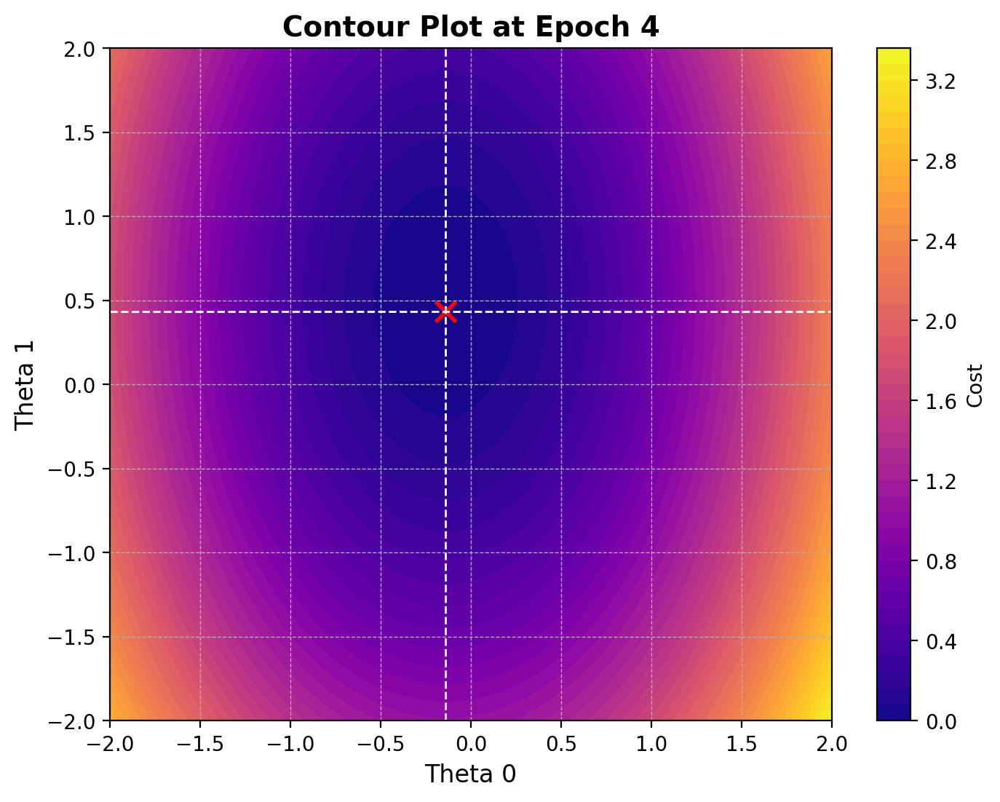

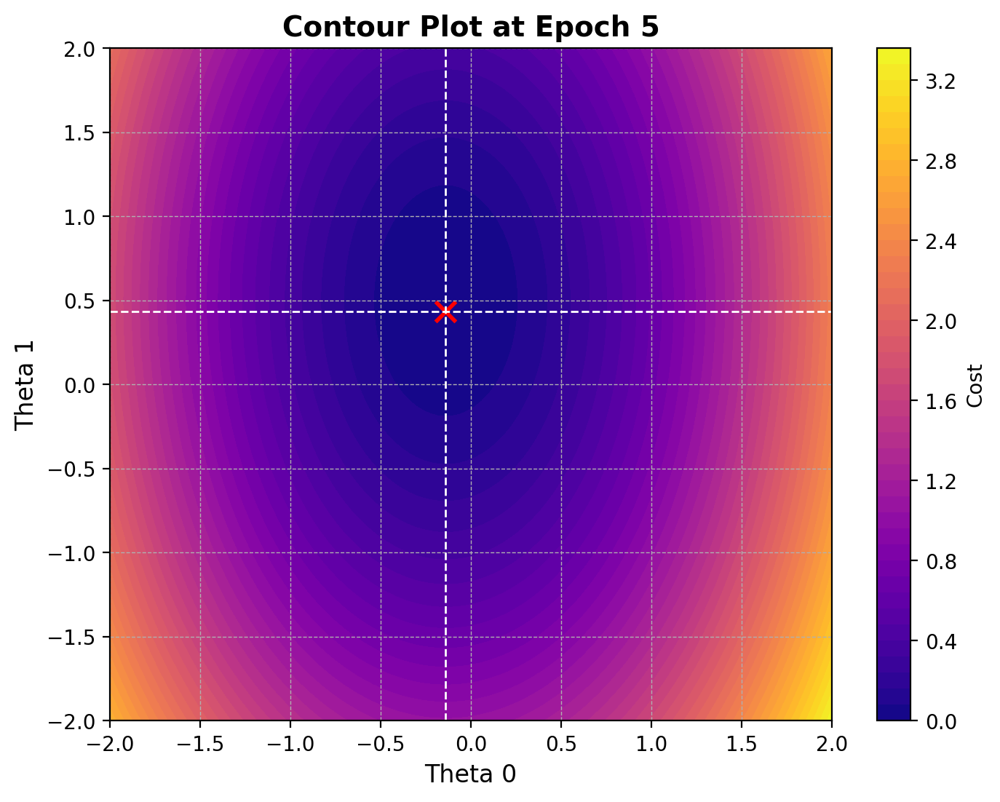

...

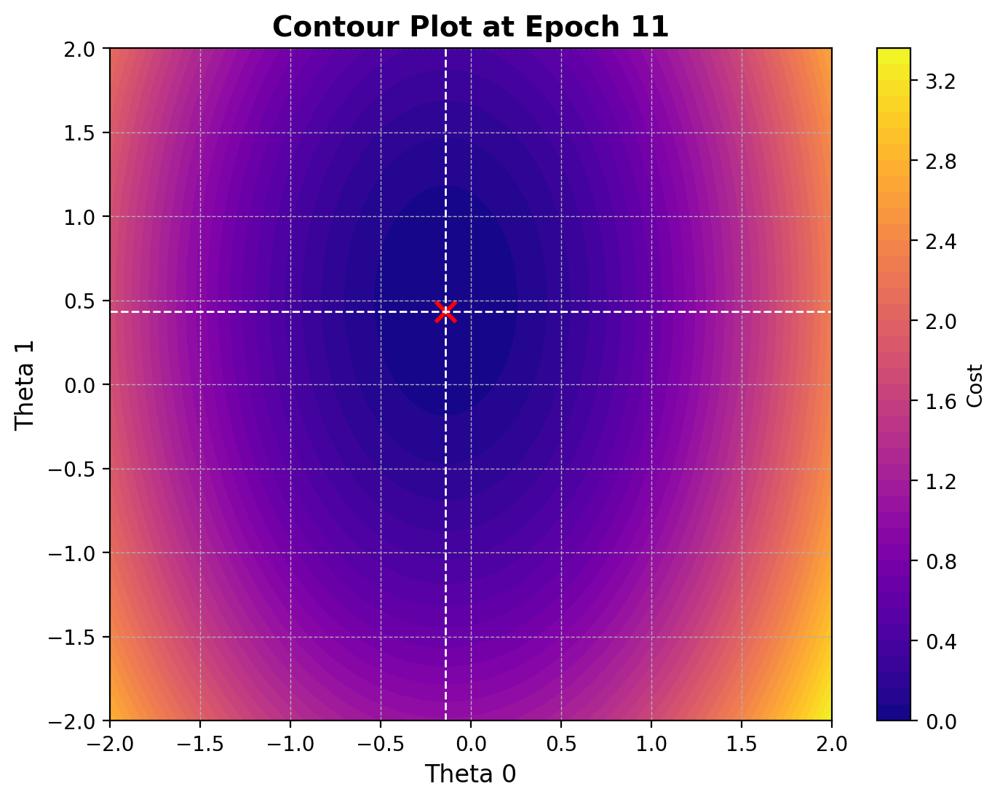

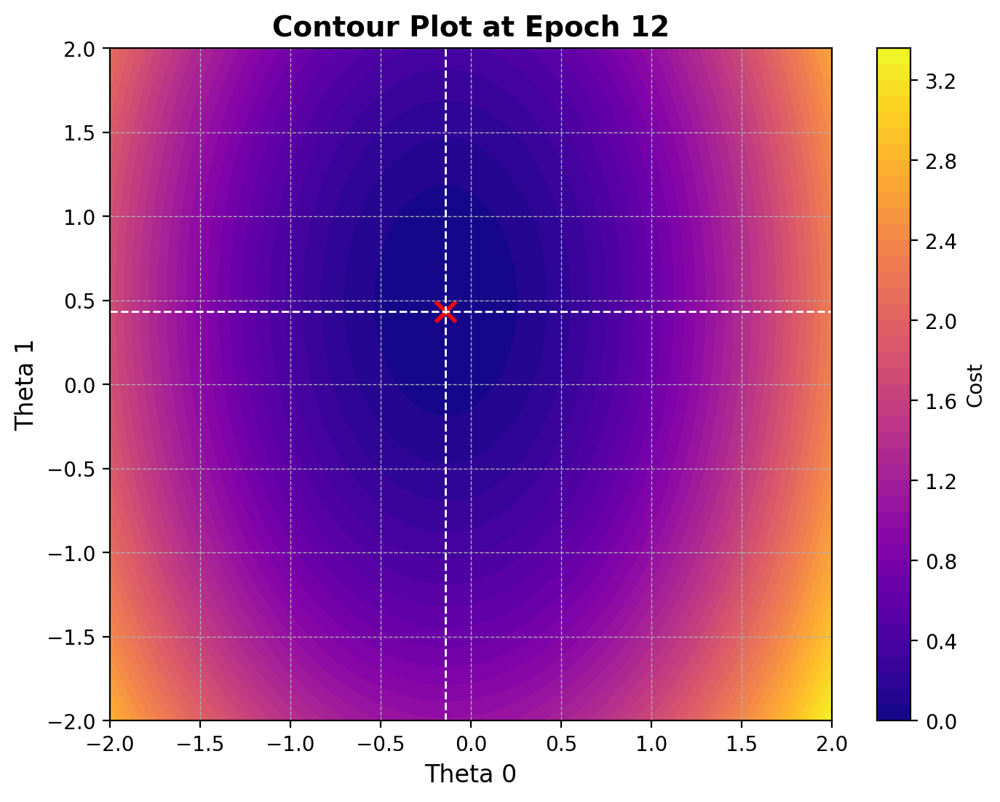

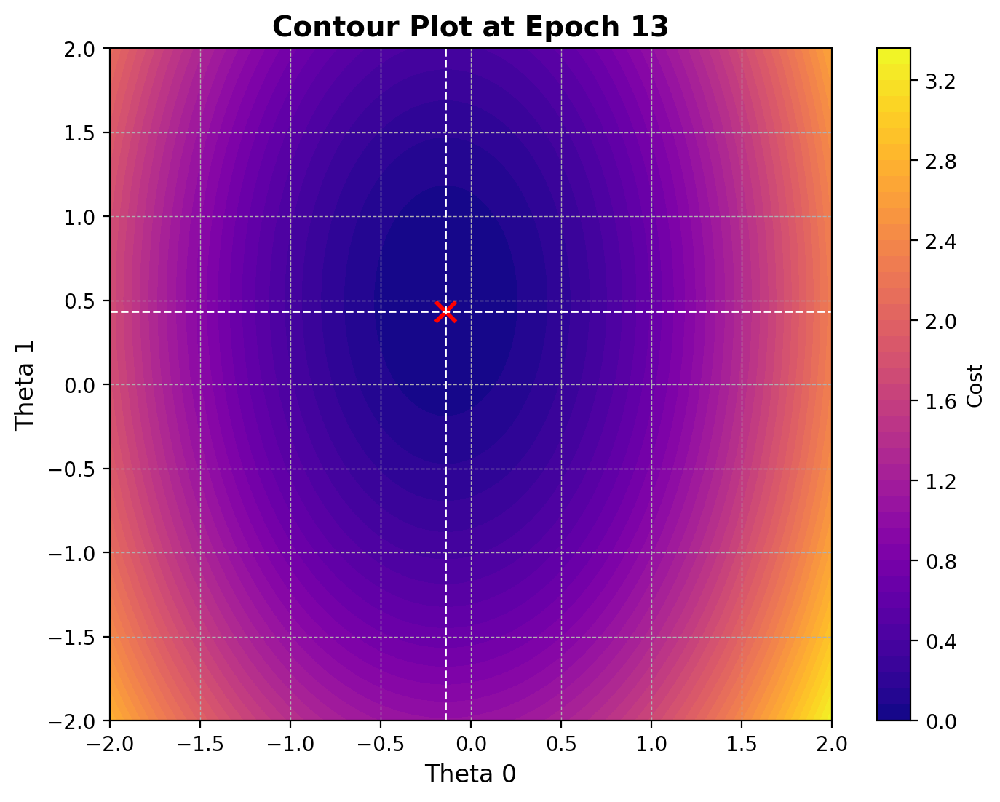

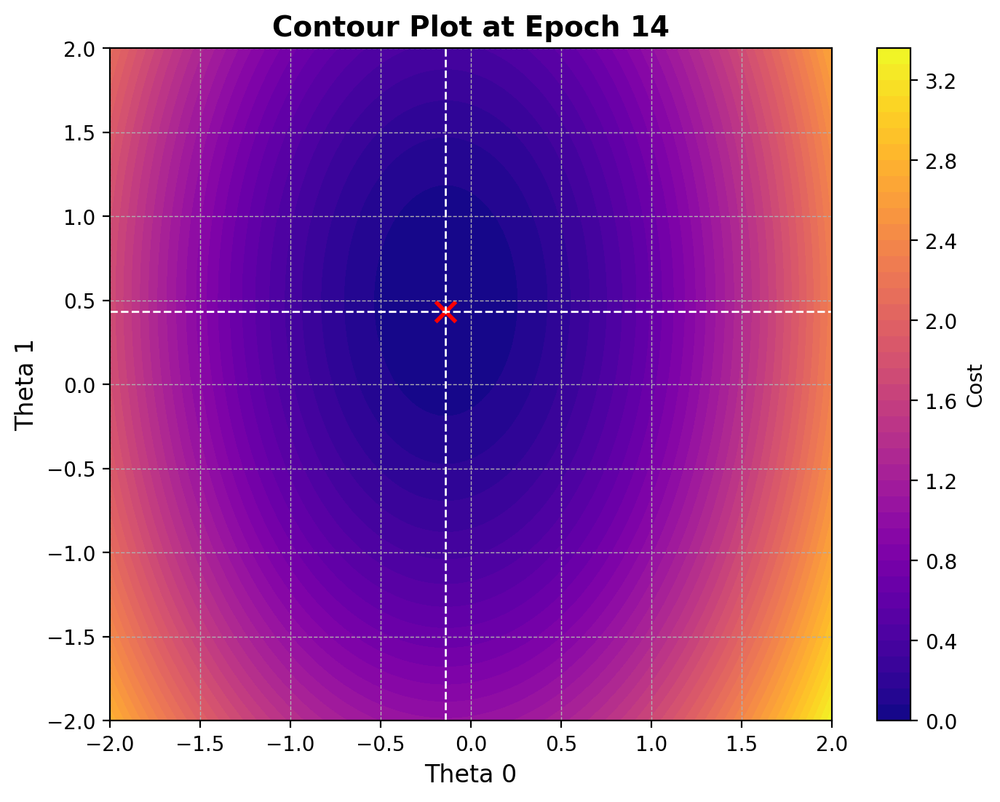

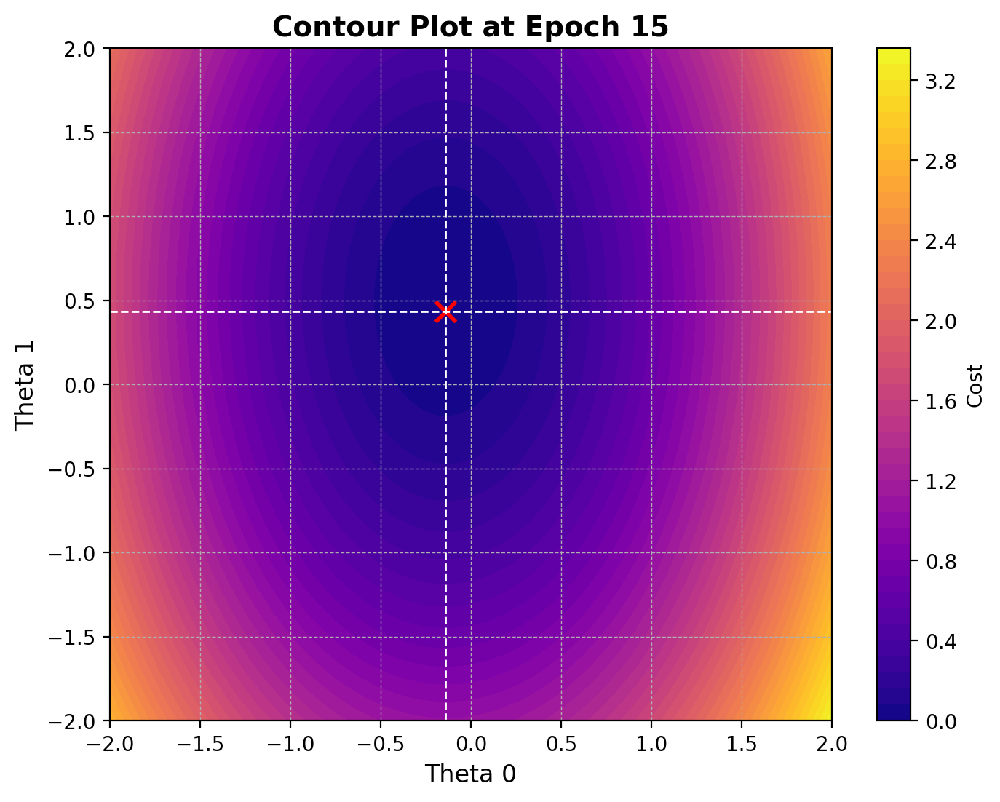

In [68]:
plot_contours(sgd_grad_thetas[:15],X,y)

In [69]:
def plot_loss(loss_histories, labels):
    plt.figure(figsize=(12, 8))
    for loss_history, label in zip(loss_histories, labels):
        plt.plot(np.arange(1, len(loss_history) + 1), loss_history, label=label)
    
    plt.xlabel('Epochs x1000')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Loss vs. Epochs for Different Gradient Descent Methods')
    plt.grid(True)
    plt.show()

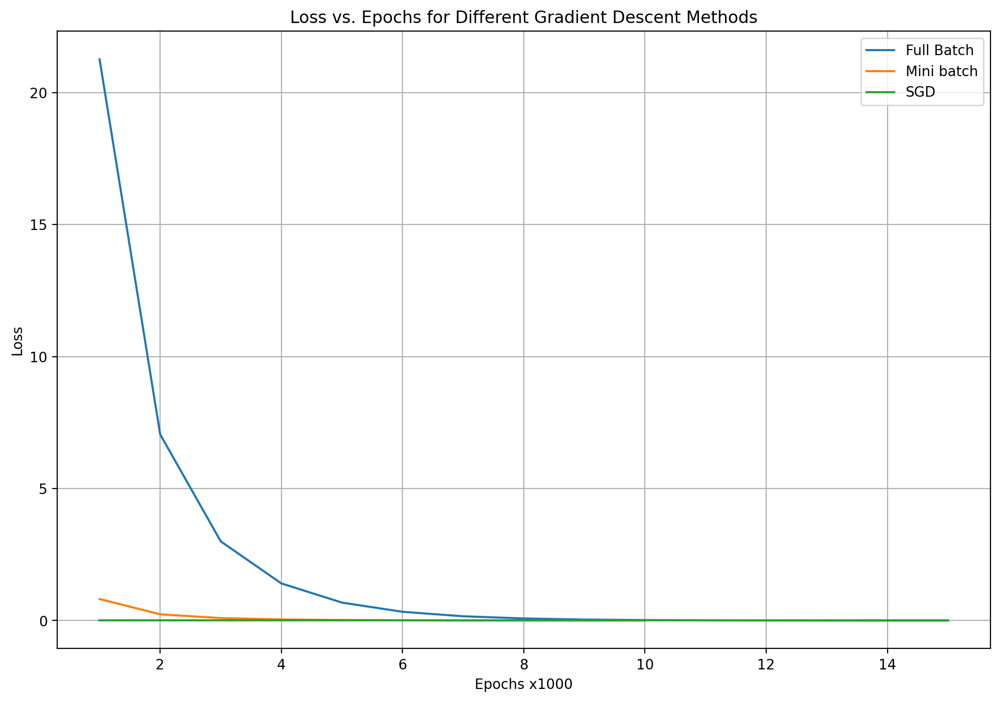

Number of iterations in full batch:	 14383 		Total Iterations:	 50000 		Ratio: 	 0.28766
Number of iterations in mini batch:	 9486 		Total Iterations:	 500000 	Ratio: 	 0.018972
Number of iterations in sgd grad:	 15295 		Total Iterations:	 10000000 	Ratio: 	 0.0015295


In [70]:
loss_histories = [full_grad_losses,mini_grad_losses,sgd_grad_losses[:len(full_grad_losses)]]
labels = ["Full Batch","Mini batch","SGD"]
plot_loss(loss_histories,labels)

print("Number of iterations in full batch:\t",full_grad_iters,"\t\tTotal Iterations:\t",epochs,"\t\tRatio: \t",full_grad_iters/epochs)
print("Number of iterations in mini batch:\t",mini_grad_iters,"\t\tTotal Iterations:\t",epochs*num_batch,"\tRatio: \t",mini_grad_iters/(epochs*num_batch))
print("Number of iterations in sgd grad:\t",sgd_grad_iters,"\t\tTotal Iterations:\t",epochs*X.shape[0],"\tRatio: \t",sgd_grad_iters/(epochs*X.shape[0]))